In [118]:
import os
from os.path import join

from matplotlib.colors import LinearSegmentedColormap, to_rgba
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from nilearn import plotting, image, glm
from neuromaps.datasets import fetch_fslr
from neuromaps import transforms
import neuromaps.transforms as transforms
from neuromaps.parcellate import Parcellater
import nibabel as nib
from subprocess import call
from surfplot import Plot
import hcp_utils as hcp

### colorbar

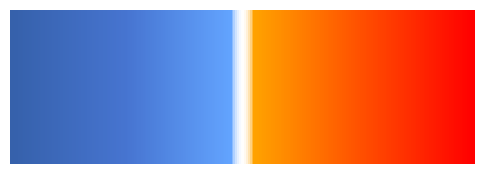

In [182]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap, to_rgba

# Define the colors with specified opacities
colors_with_opacity = [
    (-20, to_rgba("#3661ab", alpha=1.0)),  # Fully opaque
    (-10, to_rgba('#4775d1', alpha=1)),
    (-1, to_rgba("#63a4ff", alpha=1)),    # Fully opaque
    (0, to_rgba("white", alpha=0)),            # Transparent
    
    (1, to_rgba("#ffa300", alpha=1)),     # Fully opaque
    (10, to_rgba('#FF5200', alpha=1)),
    (20, to_rgba("#ff0000", alpha=1.0))     # Fully opaque
]


# Adjust normalization points
# Since the original approach equally spaces colors, and you want to exclude 0,
# we need to manually specify the points to ensure the gradient appears as desired.
# This step involves careful adjustment.

# Determine new normalization points directly
norm_points = np.array([-20, -10, -1, 0, 1, 10,20])

# Normalize these points to the [0, 1] range
min_point, max_point = norm_points.min(), norm_points.max()
norm_points = (norm_points - min_point) / (max_point - min_point)

# Prepare colors for the colormap
norm_colors = [c[1] for c in colors_with_opacity]

# Create the custom colormap
testcmap = LinearSegmentedColormap.from_list("custom_gradient", list(zip(norm_points, norm_colors)))

# Create a gradient to visualize the colormap
gradient = np.linspace(0, 1, 256)
gradient = np.vstack((gradient, gradient))

# Plot the gradient
fig, ax = plt.subplots(figsize=(6, 2))
ax.imshow(gradient, aspect='auto', cmap=testcmap)
ax.set_axis_off()

plt.show()


In [83]:
hcp.struct.keys()

dict_keys(['cortex_left', 'cortex_right', 'cortex', 'subcortical', 'accumbens_left', 'accumbens_right', 'amygdala_left', 'amygdala_right', 'brainStem', 'caudate_left', 'caudate_right', 'cerebellum_left', 'cerebellum_right', 'diencephalon_left', 'diencephalon_right', 'hippocampus_left', 'hippocampus_right', 'pallidum_left', 'pallidum_right', 'putamen_left', 'putamen_right', 'thalamus_left', 'thalamus_right'])

### check pvalue

/Users/h/miniconda3/envs/spacetop/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/h/miniconda3/envs/spacetop/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


<Axes: ylabel='Count'>

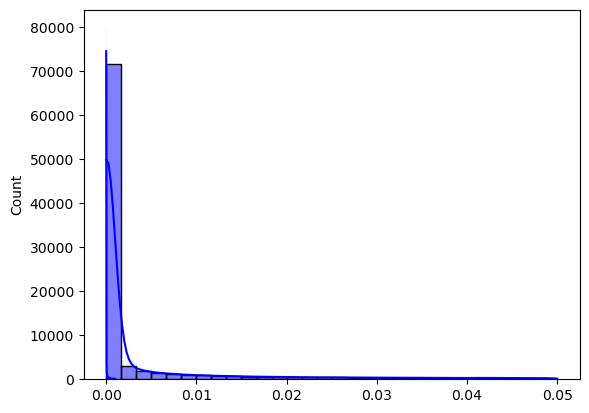

In [138]:



color_range = (np.nanmin(data), np.nanmax(data))
# Load the .dscalar.nii file - t map and p values
img = nib.load(fpath)
pvalue_img = nib.load(pvalue_fpath)
loaded_data = img.get_fdata().squeeze()  # Remove the singleton dimension
pvalue_data = pvalue_img.get_fdata().squeeze()

pvalue_binarize = pvalue_data
sns.histplot(pvalue_data, bins=30, kde=True, color='blue')
pvalue_binarize[pvalue_data >= .001] = 0
sns.histplot(pvalue_binarize, bins=30, kde=True, color='blue')

# Main code: load and plot tmap

In [207]:
hcp.struct.cortex_left
hcp.struct.cortex_right.start
hcp.struct.cortex_right.stop

59412

In [215]:

left_idx_start = hcp.struct.cortex_left.start; left_idx_stop = hcp.struct.cortex_left.stop; 
right_idx_start = hcp.struct.cortex_right.start; right_idx_stop = hcp.struct.cortex_right.stop; 
loaded_data[left_idx_start:left_idx_stop]

array([-8.3049202 , -5.7539897 , -3.62602973, ..., -4.37098789,
       -4.08639526, -4.43518925])

In [265]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from os.path import join
from neuromaps.datasets import fetch_atlas
from surfplot import Plot

def plot_brain_surfaces(datadir, fname, pvaluefname, colormap, key, pthreshold=0.001):
    # Construct file paths
    fpath = join(datadir, fname)
    pvalue_fpath = join(datadir, pvaluefname)
    
    # Load data: tmap and pvalues __________________________________________________
    img = nib.load(fpath)
    pvalue_img = nib.load(pvalue_fpath)
    loaded_data = img.get_fdata().squeeze()  # Remove the singleton dimension
    pvalue_data = pvalue_img.get_fdata().squeeze()

    loaded_data[pvalue_data >= pthreshold] = 0
    loaded_data[pvalue_data >= pthreshold] = 0

    # set plot parameters __________________________________________________________

    color_range = (np.nanmin(loaded_data), np.nanmax(loaded_data))


    # split left and right hemisphere ______________________________________________
    left_idx_start = hcp.struct.cortex_left.start; left_idx_stop = hcp.struct.cortex_left.stop; 
    right_idx_start = hcp.struct.cortex_right.start; right_idx_stop = hcp.struct.cortex_right.stop; 
    left_data = loaded_data[left_idx_start:left_idx_stop].squeeze()
    right_data = loaded_data[right_idx_start:right_idx_stop].squeeze()
    left_data_fill = hcp.left_cortex_data(left_data, fill=0)
    right_data_fill = hcp.right_cortex_data(right_data, fill=0)

    surfaces_fslr = fetch_fslr()
    lh_fslr, rh_fslr = surfaces_fslr['inflated']

    # surfplot _____________________________________________________________________
    p = Plot(
        surf_lh=lh_fslr,
        surf_rh=rh_fslr,
        size=(5000, 1000),
        zoom=1.2,
        layout='row',
        views=['lateral', 'medial', 'ventral', 'posterior'],
        mirror_views=True,
        brightness=.7
    )
    p.add_layer(
        {'left': left_data_fill, 'right': right_data_fill},
        cmap=colormap,
        cbar=True,
        color_range=color_range,
        cbar_label=key
    )
    cbar_kws = dict(outer_labels_only=True, pad=.02, n_ticks=2, decimals=3)
    fig = p.build(cbar_kws=cbar_kws)
    fig.show()
    return(fig)




### pain

/var/folders/sq/9y9jm3711js9zfqyb64n8c840000gn/T/ipykernel_37401/3635821077.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


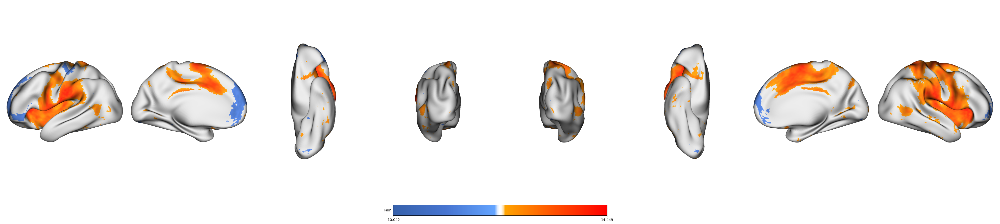

In [266]:
# Example usage
datadir = '/Volumes/bogdan_atlas/stats/spacetop_cifti/one_sample_t_test/robust0013'
fname = 'rob_tmap_0001.dscalar.nii'
pvaluefname = 'rob_p_0001.dscalar.nii'
colormap = testcmap
key = 'Pain'

p = plot_brain_surfaces(datadir, fname, pvaluefname, colormap, key, pthreshold=.001)
p.savefig('/Users/h/Dropbox/conference/2024/ohbm/surfplot/Pain.svg', dpi=300, transparent=True)


### vicarious

/var/folders/sq/9y9jm3711js9zfqyb64n8c840000gn/T/ipykernel_37401/3635821077.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


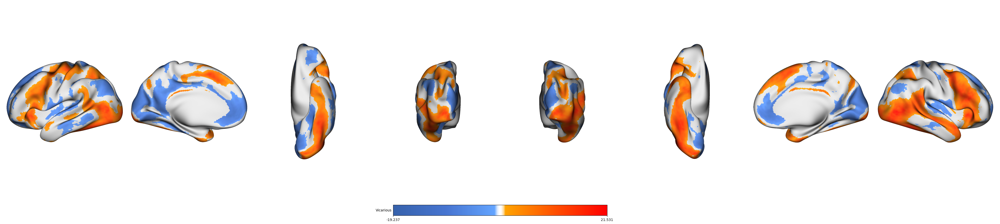

In [267]:
# Example usage
datadir = '/Volumes/bogdan_atlas/stats/spacetop_cifti/one_sample_t_test/robust0014'
fname = 'rob_tmap_0001.dscalar.nii'
pvaluefname = 'rob_p_0001.dscalar.nii'
colormap = testcmap
key = 'Vicarious'

v = plot_brain_surfaces(datadir, fname, pvaluefname, colormap, key, pthreshold=.001)
v.savefig(f'/Users/h/Dropbox/conference/2024/ohbm/surfplot/{key}.svg', dpi=300, transparent=True)


### cognitive

/var/folders/sq/9y9jm3711js9zfqyb64n8c840000gn/T/ipykernel_37401/3635821077.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


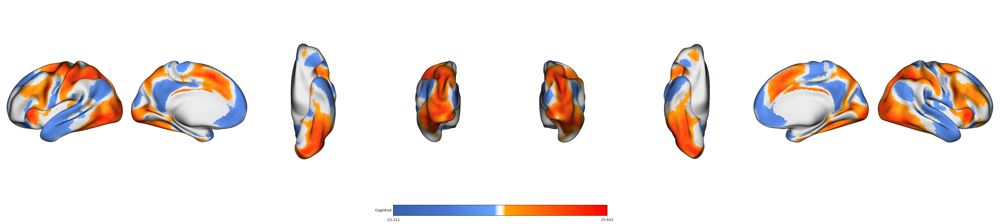

In [268]:
# Example usage
datadir = '/Volumes/bogdan_atlas/stats/spacetop_cifti/one_sample_t_test/robust0015'
fname = 'rob_tmap_0001.dscalar.nii'
pvaluefname = 'rob_p_0001.dscalar.nii'
colormap = testcmap
key = 'Cognitive'

c = plot_brain_surfaces(datadir, fname, pvaluefname, colormap, key, pthreshold=.001)
c.savefig(f'/Users/h/Dropbox/conference/2024/ohbm/surfplot/{key}.svg', dpi=300, transparent=True)


### motor

/var/folders/sq/9y9jm3711js9zfqyb64n8c840000gn/T/ipykernel_37401/3635821077.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


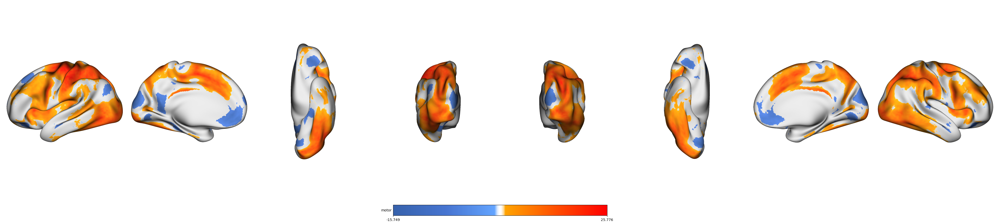

In [275]:
# Example usage
datadir = '/Volumes/bogdan_atlas/stats/spacetop_cifti/one_sample_t_test/robust0009'
fname = 'rob_tmap_0001.dscalar.nii'
pvaluefname = 'rob_p_0001.dscalar.nii'
colormap = testcmap
key = 'motor'

m = plot_brain_surfaces(datadir, fname, pvaluefname, colormap, key, pthreshold=.0001)
m.savefig(f'/Users/h/Dropbox/conference/2024/ohbm/surfplot/{key}.svg', dpi=300, transparent=True)


### tomsaxe

/var/folders/sq/9y9jm3711js9zfqyb64n8c840000gn/T/ipykernel_37401/3635821077.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


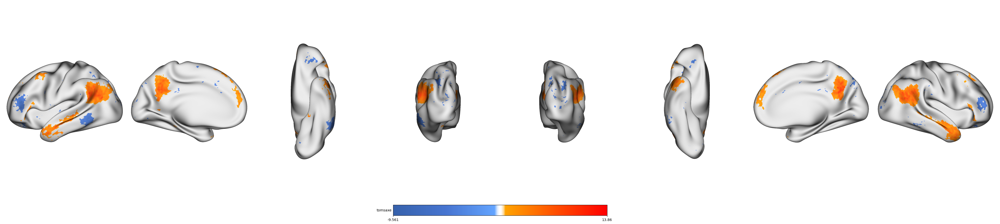

In [270]:
# Example usage
datadir = '/Volumes/bogdan_spacetop_hyperalignment-1/stats/spm/fractional/tomsaxe/one_sample_t_test/robust0005'
fname = 'rob_tmap_0001.dscalar.nii'
pvaluefname = 'rob_p_0001.dscalar.nii'
colormap = testcmap
key = 'tomsaxe'

tomsaxe = plot_brain_surfaces(datadir, fname, pvaluefname, colormap, key, pthreshold=.001)
tomsaxe.savefig(f'/Users/h/Dropbox/conference/2024/ohbm/surfplot/{key}.svg', 
                dpi=300, transparent=True)


# memory

- 1 memory_study
- 2 memory_math
- 3 memory_correct_recall
- 4 memory_incorrect_recall
- 5 memory_correct_new
- 6 memory_incorrect_new
- 7 memory_correct
- 8 memory_incorrect
- 9 memory_recall
- 10 memory_new
- 11 memory_test
- 12 memory_correct_v_incorrect
- 13 memory_recall_v_new

/var/folders/sq/9y9jm3711js9zfqyb64n8c840000gn/T/ipykernel_37401/3635821077.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


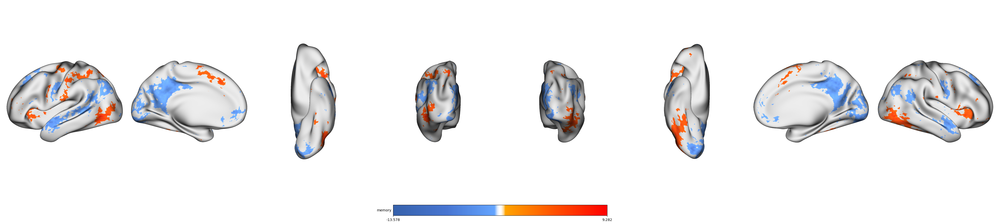

In [271]:
# Example usage
datadir = '/Volumes/bogdan_spacetop_hyperalignment-1/stats/spm/fractional/memory/one_sample_t_test/robust0003'
fname = 'rob_tmap_0001.dscalar.nii'
pvaluefname = 'rob_p_0001.dscalar.nii'
colormap = testcmap
key = 'memory3'

memory = plot_brain_surfaces(datadir, fname, pvaluefname, colormap, key, pthreshold=.01)
memory.savefig(f'/Users/h/Dropbox/conference/2024/ohbm/surfplot/{key}.svg', dpi=300, transparent=True)


/var/folders/sq/9y9jm3711js9zfqyb64n8c840000gn/T/ipykernel_37401/3635821077.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


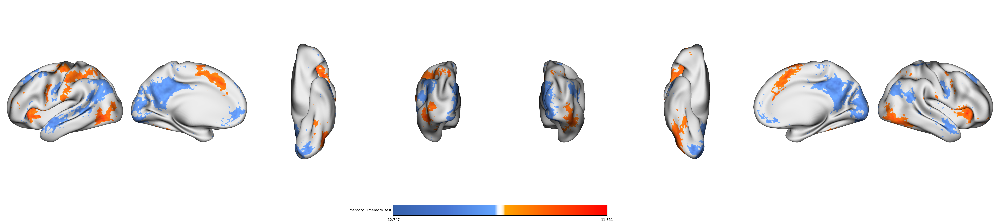

In [273]:
# Example usage
datadir = '/Volumes/bogdan_spacetop_hyperalignment-1/stats/spm/fractional/memory/one_sample_t_test/robust0011'
fname = 'rob_tmap_0001.dscalar.nii'
pvaluefname = 'rob_p_0001.dscalar.nii'
colormap = testcmap
key = 'memory11memory_test'

memory = plot_brain_surfaces(datadir, fname, pvaluefname, colormap, key, pthreshold=.01)
memory.savefig(f'/Users/h/Dropbox/conference/2024/ohbm/surfplot/{key}.svg', dpi=300, transparent=True)


/var/folders/sq/9y9jm3711js9zfqyb64n8c840000gn/T/ipykernel_37401/3635821077.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


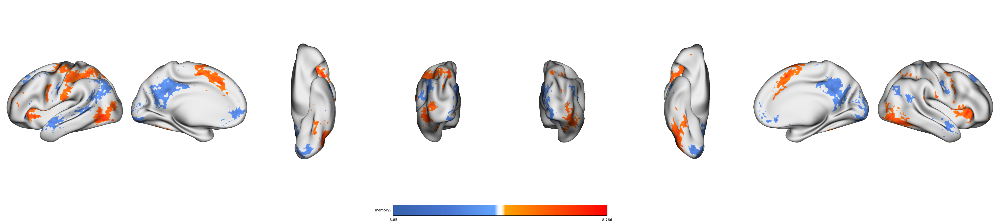

In [272]:
# Example usage
datadir = '/Volumes/bogdan_spacetop_hyperalignment-1/stats/spm/fractional/memory/one_sample_t_test/robust0009'
fname = 'rob_tmap_0001.dscalar.nii'
pvaluefname = 'rob_p_0001.dscalar.nii'
colormap = testcmap
key = 'memory9'

memory = plot_brain_surfaces(datadir, fname, pvaluefname, colormap, key, pthreshold=.01)
memory.savefig(f'/Users/h/Dropbox/conference/2024/ohbm/surfplot/{key}.svg', dpi=300, transparent=True)


## tomspunt

/var/folders/sq/9y9jm3711js9zfqyb64n8c840000gn/T/ipykernel_37401/3635821077.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


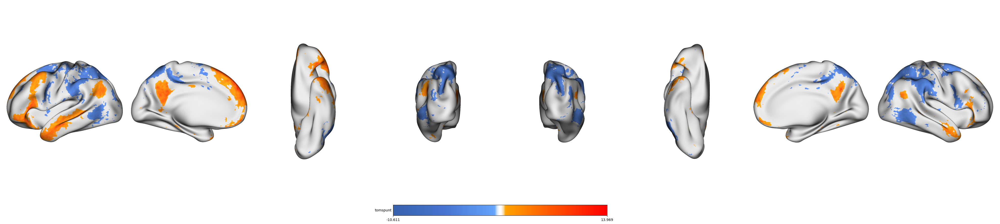

In [274]:
# Example usage
datadir = '/Volumes/bogdan_spacetop_hyperalignment-1/stats/spm/fractional/tomspunt/one_sample_t_test/robust0007'
fname = 'rob_tmap_0001.dscalar.nii'
pvaluefname = 'rob_p_0001.dscalar.nii'
colormap = testcmap
key = 'tomspunt'

memory = plot_brain_surfaces(datadir, fname, pvaluefname, colormap, key, pthreshold=.01)
memory.savefig(f'/Users/h/Dropbox/conference/2024/ohbm/surfplot/{key}.svg', dpi=300, transparent=True)


/var/folders/sq/9y9jm3711js9zfqyb64n8c840000gn/T/ipykernel_37401/3635821077.py:57: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


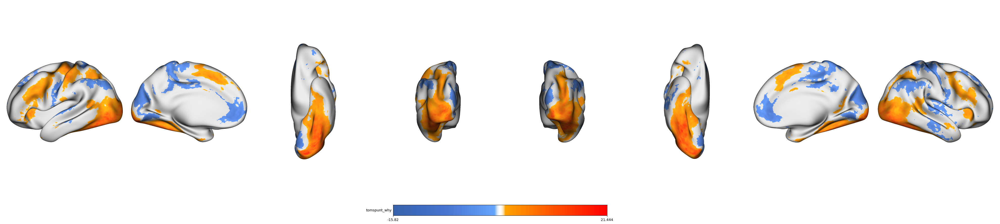

In [276]:
# Example usage
datadir = '/Volumes/bogdan_spacetop_hyperalignment-1/stats/spm/fractional/tomspunt/one_sample_t_test/robust0005'
fname = 'rob_tmap_0001.dscalar.nii'
pvaluefname = 'rob_p_0001.dscalar.nii'
colormap = testcmap
key = 'tomspunt_why'

memory = plot_brain_surfaces(datadir, fname, pvaluefname, colormap, key, pthreshold=.01)
memory.savefig(f'/Users/h/Dropbox/conference/2024/ohbm/surfplot/{key}.svg', dpi=300, transparent=True)
